In [1]:
import tensorflow.keras.backend as K

# Reset TensorFlow session
K.clear_session()
import os
os.environ['tf_CPP_MIN_LOG_LOEVEL'] = '2'
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Embedding, LSTM, Dense, Input, Activation, RepeatVector, Permute, Multiply, Lambda
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Reshape

2024-06-10 14:05:06.932868: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-10 14:05:07.578263: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


2024-06-10 14:05:10.307326: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:282] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


In [3]:
OT_data = pd.read_csv('/home/dell15/Pragya/Objective3_new/Training-Datasets/Training-data_insertions-refine.csv')

In [4]:
if "repair_outcome" in OT_data.columns:
    # Replace "non indels" with 0 in the "repair_outcomes" column
    OT_data["repair_outcome"] = OT_data["repair_outcome"].replace("no indel", "X")
    OT_data.loc[OT_data["repair_outcome"].str.len() > 4, "repair_outcome"] = "Y"

In [5]:
print(OT_data)

                                    sequence from SAM file repair_outcome
0        TCCTCTGGGGAAAGAGTGGCCTAAAGTGTCTTTGATTGTAACTATG...              X
1        TCCTCTGGGGAAAGAGTGGCCTAAAGTGTCTTTGATTGTAACTATG...              X
2        TCCTCTGGGGAAAGAGTGGCCTAAAGTGTCTTTGATTGTAACTATG...              X
3        TCCTCTGGGGAAAGAGTGGCCTAAAGTGTCTTTGATTGTAACTATG...              X
4        TCCTCTGGGGAAAGAGTGGCCTAAAGTGTCTTTGATTGTAACTATG...              X
...                                                    ...            ...
1048570  CAACCACCTCAGAAGAGCCAGATTCCACTTCTGTGGCCAGGACTTT...              X
1048571  AACTGGTTTAGCTAGTGCATACATGCACACGTGTGCACACATCCTG...              X
1048572  CAACCACCTCAGAAGAGCCAGATTCCACTTCTGTGGCCAGGACTTT...              X
1048573  CACTGGTTTAGCTAGTGCATACATGCACACGTGTGCACACAGCCTG...              X
1048574  AACTGGTTTAGCTAGTGCATACATGCACACGTGTGCACACAGCCTG...              X

[1048575 rows x 2 columns]


In [6]:
# Function to trim sequences from both ends to length 50
def trim_sequence(sequence, length=50):
    if len(sequence) <= length:
        return sequence
    trim_amount = (len(sequence) - length) // 2
    return sequence[trim_amount:trim_amount + length]


# Apply trimming function to the first column
OT_data['sequence from SAM file'] = OT_data['sequence from SAM file'].apply(lambda x: trim_sequence(x, length=50))

In [7]:
print(OT_data)

                                    sequence from SAM file repair_outcome
0        GCGTGATAAACTTTCATTTTCCAACGAGGACATTCCAAAATGTTAA...              X
1        GCGTGATAAACTTTCATTTTCCAACGAGGACATTCCAAAATGTTAA...              X
2        GCGTGATAAACTTTCATTTTCCAACGAGGACGTTCCAAAATGTTAA...              X
3        GCGTGATAAACTTTCATTTTCCAACGAGGACATTCCAAAATGTTAA...              X
4        GCGTGATAAACTTTCATTTTCCAACGAGGACATTCCAAAATGTTAA...              X
...                                                    ...            ...
1048570  CCACGAACAAGGCTAAAAGATCGGAGGAAATTCAGTGAATATACAG...              X
1048571  ATCATCATCTTATCCTTTTTCTTCATTATTGCTAATGGATTATAGC...              X
1048572  CCACAAACAAGGCTAAAAGATCGGAGGAAATTCAGTGAATATACAG...              X
1048573  ATCATCATCTTATCCTTTTTCTTCATTATTGCTAATGGATTATAGC...              X
1048574  ATCATCATCTTATCCTTTTTCTTCATTATTGCTAATGGATTATAGC...              X

[1048575 rows x 2 columns]


In [8]:
# Clean up column names (remove leading/trailing spaces)
OT_data.columns = OT_data.columns.str.strip()

# Extract features and target from the dataset
data = OT_data['sequence from SAM file'].values
target = OT_data['repair_outcome'].values

In [9]:
print(target)
num_classes = len(OT_data['repair_outcome'].unique())
print("Number of classes:", num_classes)


['X' 'X' 'X' ... 'X' 'X' 'X']
Number of classes: 62


In [10]:
import numpy as np

# Assuming 'target' is your numpy array containing class labels
class_labels, class_counts = np.unique(target, return_counts=True)

# Print the class names along with their occurrences
for class_label, count in zip(class_labels, class_counts):
    print(f"Class: {class_label}, Occurrence: {count}")


Class: A , Occurrence: 57
Class: AA , Occurrence: 18
Class: AAA , Occurrence: 3
Class: AAC , Occurrence: 1
Class: AAG , Occurrence: 3
Class: AAT , Occurrence: 4
Class: AC , Occurrence: 6
Class: ACA , Occurrence: 4
Class: ACC , Occurrence: 3
Class: ACT , Occurrence: 2
Class: AG , Occurrence: 23
Class: AGA , Occurrence: 3
Class: AGG , Occurrence: 9
Class: AGT , Occurrence: 4
Class: AT , Occurrence: 21
Class: ATA , Occurrence: 9
Class: ATC , Occurrence: 25
Class: ATG , Occurrence: 3
Class: C , Occurrence: 50
Class: CA , Occurrence: 9
Class: CAA , Occurrence: 3
Class: CAG , Occurrence: 11
Class: CAT , Occurrence: 1
Class: CC , Occurrence: 46
Class: CCA , Occurrence: 1
Class: CCC , Occurrence: 1
Class: CCT , Occurrence: 1
Class: CG , Occurrence: 3
Class: CT , Occurrence: 5
Class: CTG , Occurrence: 2
Class: CTT , Occurrence: 10
Class: G , Occurrence: 22
Class: GA , Occurrence: 14
Class: GAC , Occurrence: 3
Class: GC , Occurrence: 5
Class: GCA , Occurrence: 1
Class: GG , Occurrence: 29
Class:

In [11]:
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, LSTM, Dense, Flatten, Activation, Reshape, Multiply, Lambda, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np

# Assume 'df' is your trimmed dataframe
# df = ... # Your trimmed dataframe

# Tokenize the sequences
vocab_size = 20000
tokenizer = Tokenizer(num_words=vocab_size)
tokenizer.fit_on_texts(OT_data['sequence from SAM file'])
data_seq = tokenizer.texts_to_sequences(OT_data['sequence from SAM file'])

# Define maximum sequence length
max_seq_length = 50

# Pad sequences to the same length
data_padded = pad_sequences(data_seq, maxlen=max_seq_length, padding='post')

# Convert target labels to one-hot encoded format
label_encoder = LabelEncoder()
target_encoded = label_encoder.fit_transform(OT_data['repair_outcome'])
num_classes = len(label_encoder.classes_)
target_one_hot = to_categorical(target_encoded, num_classes=num_classes)

# Split the dataset into training, validation, and test sets
data_train, data_remaining, target_train, target_remaining = train_test_split(data_padded, target_one_hot, test_size=0.3, random_state=76)
data_val, data_test, target_val, target_test = train_test_split(data_remaining, target_remaining, test_size=0.15, random_state=76)

In [12]:

# Define model architecture with attention mechanism
embedding_dim = 100
hidden_units = 128
dropout_rate = 0.2

# Input layer
input_layer = Input(shape=(max_seq_length,))

# Embedding layer
embedding_layer = Embedding(input_dim=vocab_size, output_dim=embedding_dim)(input_layer)

# LSTM layer with dropout regularization
lstm_layer = LSTM(hidden_units, return_sequences=True)(embedding_layer)
lstm_layer = Dropout(dropout_rate)(lstm_layer)

# Attention mechanism
attention_weights = Dense(1, activation='relu')(lstm_layer)
attention_weights = Flatten()(attention_weights)
attention_weights = Activation('softmax')(attention_weights)
attention_weights = Reshape((max_seq_length, 1))(attention_weights)

# Weighted sum of LSTM outputs with attention weights
weighted_output = Multiply()([lstm_layer, attention_weights])

# Adjusted Lambda layer to calculate mean along the temporal dimension
weighted_sum = Lambda(lambda x: tf.reduce_mean(x, axis=1))(weighted_output)

# Output layer
output_layer = Dense(num_classes, activation='softmax')(weighted_sum)

# Create model
modelN = Model(inputs=input_layer, outputs=output_layer)
opt = tf.keras.optimizers.Adam(learning_rate=0.01)

# Compute class weights based on class occurrences
class_occurrences = {
    "A": 57, "AA": 18, "AAA": 3, "AAC": 1, "AAG": 3, "AAT": 4,
    "AC": 6, "ACA": 4, "ACC": 3, "ACT": 2, "AG": 23, "AGA": 3,
    "AGG": 9, "AGT": 4, "AT": 21, "ATA": 9, "ATC": 25, "ATG": 3,
    "C": 50, "CA": 9, "CAA": 3, "CAG": 11, "CAT": 1, "CC": 46,
    "CCA": 1, "CCC": 1, "CCT": 1, "CG": 3, "CT": 5, "CTG": 2,
    "CTT": 10, "G": 22, "GA": 14, "GAC": 3, "GC": 5, "GCA": 1,
    "GG": 29, "GGC": 3, "GGT": 6, "GT": 6, "GTA": 1, "GTC": 15,
    "GTG": 3, "N": 21, "T": 68, "TA": 22, "TAC": 1, "TAG": 8,
    "TC": 12, "TCA": 3, "TCT": 4, "TG": 5, "TGA": 85, "TGG": 2,
    "TGT": 4, "TT": 18, "TTA": 1, "TTC": 15, "TTG": 1, "TTT": 3,
    "X": 1047454, "Y": 399
}

# Calculate class weights
total_samples = sum(class_occurrences.values())
class_weights = {cls: total_samples / (num_samples * len(class_occurrences)) for cls, num_samples in class_occurrences.items()}
class_weights_values = np.array(list(class_weights.values()), dtype=np.float32)

print("Shape of class_weights_values before reshaping:", class_weights_values.shape)
print("Number of classes (num_classes):", num_classes)

# Convert class weights array into a dictionary
class_weights_dict = {i: weight for i, weight in enumerate(class_weights_values)}

# Compile the model
modelN.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model
batch_size = 320
epochs = 15

modelN.fit(data_train, target_train, batch_size=batch_size, epochs=epochs, 
            validation_data=(data_val, target_val), callbacks=[early_stopping], class_weight=class_weights_dict)

# Evaluate the model on the test set
results = modelN.evaluate(data_test, target_test)
print("Test Loss, Test Accuracy:", results)


Shape of class_weights_values before reshaping: (62,)
Number of classes (num_classes): 62


2024-06-10 14:08:21.822788: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 146800400 exceeds 10% of free system memory.


Epoch 1/15


2024-06-10 14:08:26.464228: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 182032496 exceeds 10% of free system memory.


2294/2294 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.5238 - loss: 4.5824 - precision: 0.0000e+00 - recall: 0.0000e+00

2024-06-10 14:11:37.780564: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 53477400 exceeds 10% of free system memory.
2024-06-10 14:11:37.939011: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 66311976 exceeds 10% of free system memory.


2294/2294 ━━━━━━━━━━━━━━━━━━━━ 215s 92ms/step - accuracy: 0.5239 - loss: 4.5823 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.9862 - val_loss: 2.4893 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/15
2294/2294 ━━━━━━━━━━━━━━━━━━━━ 192s 84ms/step - accuracy: 0.9805 - loss: 3.6204 - precision: 0.2960 - recall: 3.3674e-06 - val_accuracy: 0.9694 - val_loss: 2.2125 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/15
2294/2294 ━━━━━━━━━━━━━━━━━━━━ 188s 82ms/step - accuracy: 0.9714 - loss: 2.9327 - precision: 0.9252 - recall: 2.7074e-05 - val_accuracy: 0.9730 - val_loss: 1.3890 - val_precision: 1.0000 - val_recall: 7.4798e-05
Epoch 4/15
2294/2294 ━━━━━━━━━━━━━━━━━━━━ 187s 81ms/step - accuracy: 0.9739 - loss: 2.8733 - precision: 0.8742 - recall: 0.0076 - val_accuracy: 0.9729 - val_loss: 0.9825 - val_precision: 1.0000 - val_recall: 9.7237e-05
Epoch 5/15
2294/2294 ━━━━━━━━━━━━━━━━━━━━ 187s 82ms/step - accuracy: 0.9748 - loss: 3.0402 - precision: 0.9939 

In [21]:
modelN.save("/home/dell15/Pragya/Objective3_new/Training-Datasets/model-Del-CWs.keras")

In [13]:
modelN.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 50)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 50, 100)   │  2,000,000 │ input_layer[0][0] │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 50, 128)   │    117,248 │ embedding[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 50, 128)   │          0 │ lstm[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 50, 1)     │        129 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 50)        │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 50)        │          0 │ flatten[0][0]     │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 50, 1)     │          0 │ activation[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply (Multiply) │ (None, 50, 128)   │          0 │ dropout[0][0],    │
│                     │                   │            │ reshape[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 128)       │          0 │ multiply[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 62)        │      7,998 │ lambda[0][0]      │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 6,376,127 (24.32 MB)

 Trainable params: 2,125,375 (8.11 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,250,752 (16.22 MB)

In [14]:
print("Class Weights:", class_weights)


Class Weights: {'A': 296.7105263157895, 'AA': 939.5833333333334, 'AAA': 5637.5, 'AAC': 16912.5, 'AAG': 5637.5, 'AAT': 4228.125, 'AC': 2818.75, 'ACA': 4228.125, 'ACC': 5637.5, 'ACT': 8456.25, 'AG': 735.3260869565217, 'AGA': 5637.5, 'AGG': 1879.1666666666667, 'AGT': 4228.125, 'AT': 805.3571428571429, 'ATA': 1879.1666666666667, 'ATC': 676.5, 'ATG': 5637.5, 'C': 338.25, 'CA': 1879.1666666666667, 'CAA': 5637.5, 'CAG': 1537.5, 'CAT': 16912.5, 'CC': 367.6630434782609, 'CCA': 16912.5, 'CCC': 16912.5, 'CCT': 16912.5, 'CG': 5637.5, 'CT': 3382.5, 'CTG': 8456.25, 'CTT': 1691.25, 'G': 768.75, 'GA': 1208.0357142857142, 'GAC': 5637.5, 'GC': 3382.5, 'GCA': 16912.5, 'GG': 583.1896551724138, 'GGC': 5637.5, 'GGT': 2818.75, 'GT': 2818.75, 'GTA': 16912.5, 'GTC': 1127.5, 'GTG': 5637.5, 'N': 805.3571428571429, 'T': 248.71323529411765, 'TA': 768.75, 'TAC': 16912.5, 'TAG': 2114.0625, 'TC': 1409.375, 'TCA': 5637.5, 'TCT': 4228.125, 'TG': 3382.5, 'TGA': 198.97058823529412, 'TGG': 8456.25, 'TGT': 4228.125, 'TT': 

In [15]:
results = modelN.evaluate(data_test, target_test)
print(results)


1475/1475 ━━━━━━━━━━━━━━━━━━━━ 12s 8ms/step - accuracy: 0.9740 - loss: 0.3370 - precision: 0.9995 - recall: 0.9635
[0.34023022651672363, 0.9736786484718323, 0.9995383024215698, 0.9634637236595154]


In [16]:
# Evaluate the model
loss, accuracy, precision, recall = modelN.evaluate(data_test, target_test)
print(f'Test Loss: {loss:.4f}')
print(f'Test Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')

1475/1475 ━━━━━━━━━━━━━━━━━━━━ 12s 8ms/step - accuracy: 0.9740 - loss: 0.3370 - precision: 0.9995 - recall: 0.9635
Test Loss: 0.3402
Test Accuracy: 0.9737
Precision: 0.9995
Recall: 0.9635


In [17]:
target_predP = modelN.predict(data_test)
#target_pred_probs = modelN.predict(data_test)
target_pred = np.argmax(target_predP, axis=1)

1475/1475 ━━━━━━━━━━━━━━━━━━━━ 18s 11ms/step


In [18]:
target_test_arg=np.argmax(target_test,axis=1)
print(target_pred)
print(target_test_arg)

[60 60 60 ... 60 60 60]
[60 60 60 ... 60 60 60]


In [19]:
from sklearn.metrics import classification_report
print(classification_report(target_test_arg, target_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.33      1.00      0.50         1
           3       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
          10       0.06      1.00      0.11         1
          11       0.00      0.00      0.00         0
          12       0.07      1.00      0.13         3
          14       0.00      0.00      0.00         1
          16       1.00      1.00      1.00         1
          18       0.00      0.00      0.00         0
          23       0.06      0.75      0.11         4
          25       0.00      0.00      0.00         0
          27       0.00      0.00      0.00         1
          28       0.00      0.00      0.00         2
          31       0.00      0.00      0.00         1
          32       0.00      0.00      0.00         1
          33       0.00      0.00      0.00         0
          36       1.00    

/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifie

/tmp/ipykernel_686665/669385436.py:14: RuntimeWarning: invalid value encountered in divide
  normalized_conf_matrix = conf_matrix / row_sums[:, np.newaxis]


Normalized Confusion Matrix:
     0         1         2         3         4         5         6         7   \
0   0.0  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
1   0.0  1.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2   NaN       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3   NaN       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4   0.0  0.000000  0.000000  0.000000  1.000000  0.000000  0.000000  0.000000   
5   NaN       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
6   0.0  0.000000  0.000000  0.000000  0.000000  0.000000  1.000000  0.000000   
7   0.0  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
8   0.0  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
9   NaN       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
10  0.0  0.000000  0.000000  0.250000  0.000000  0.000000  0.000000  0.000000   

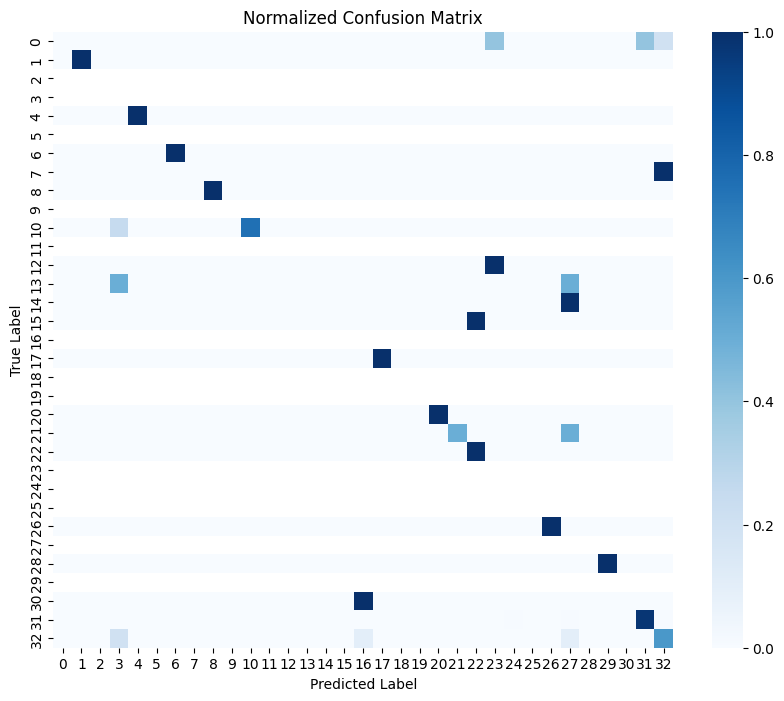

In [20]:
from sklearn.metrics import confusion_matrix

# Convert one-hot encoded or multi-label target_test to class labels
if len(target_test.shape) > 1:
    target_test = np.argmax(target_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(target_test, target_pred)

# Calculate row-wise sums
row_sums = conf_matrix.sum(axis=1)

# Normalize the confusion matrix
normalized_conf_matrix = conf_matrix / row_sums[:, np.newaxis]

# Convert the normalized confusion matrix to a DataFrame
normalized_conf_matrix_df = pd.DataFrame(normalized_conf_matrix)

# Print the normalized confusion matrix
print("Normalized Confusion Matrix:")
print(normalized_conf_matrix_df)

import matplotlib.pyplot as plt
import seaborn as sns

# Plot the normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(normalized_conf_matrix_df, cmap="Blues")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Normalized Confusion Matrix")
plt.show()


In [21]:
epsilon = 1e-10
normalized_confusion_matrix = conf_matrix.astype('float') / (conf_matrix.sum(axis=1)[:, np.newaxis] + epsilon)
print("Normalized Confusion Matrix:\n", normalized_confusion_matrix)

# Diagonal elements represent correct classifications
correct_classifications = np.diag(normalized_confusion_matrix)

# Off-diagonal elements represent incorrect classifications
incorrect_classifications = normalized_confusion_matrix.sum() - correct_classifications.sum()

# Total number of classifications
total_classifications = normalized_confusion_matrix.sum()

# Percentage of correct classifications
percentage_correct = (correct_classifications.sum() / total_classifications) * 100

# Percentage of incorrect classifications
percentage_incorrect = (incorrect_classifications / total_classifications) * 100

print(f"Percentage of Correct Classifications: {percentage_correct:.2f}%")
print(f"Percentage of Incorrect Classifications: {percentage_incorrect:.2f}%")

Normalized Confusion Matrix:
 [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  4.00000000e-01 2.00000000e-01]
 [0.00000000e+00 1.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 4.24277138e-05 1.27283141e-04 ... 0.00000000e+00
  9.74076667e-01 6.38537092e-03]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 6.00000000e-01]]
Percentage of Correct Classifications: 54.12%
Percentage of Incorrect Classifications: 45.88%


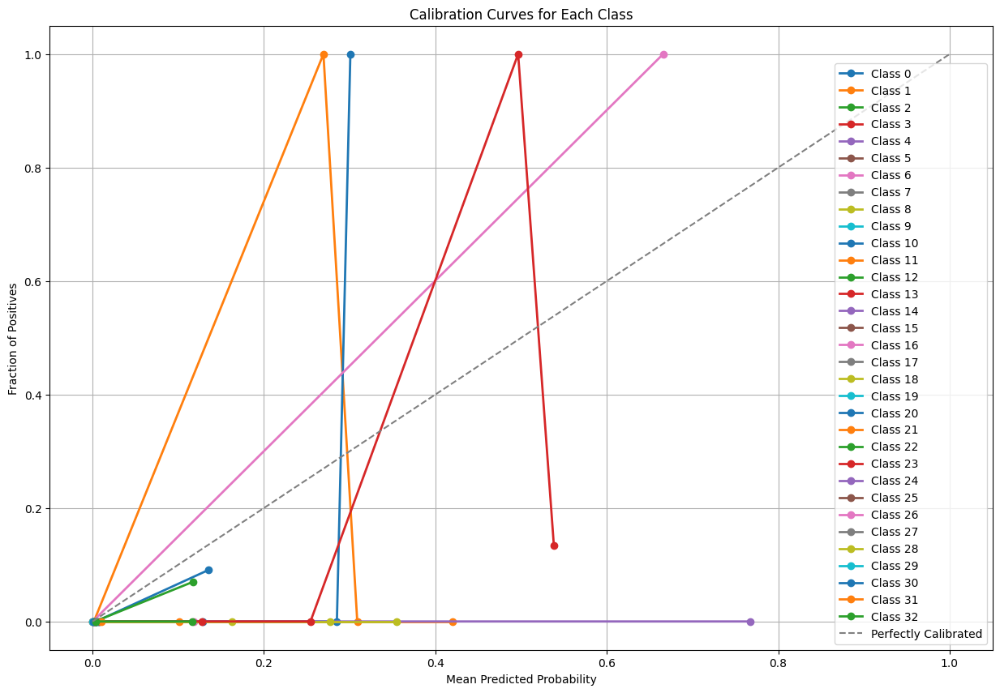

In [24]:
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve
from sklearn.preprocessing import label_binarize
import numpy as np

# Assuming you have your model predictions and true labels
# target_test contains true labels and target_pred contains predicted probabilities for each class
# Replace n_classes with the actual number of classes in your dataset

n_classes = 33  # Adjust this to match your number of classes

# Binarize the true labels
y_test_bin = label_binarize(target_test, classes=np.arange(n_classes))

# Initialize the plot
plt.figure(figsize=(15, 10))

# Plot calibration curve for each class
for i in range(n_classes):
    prob_true, prob_pred = calibration_curve(y_test_bin[:, i], target_predP[:, i], n_bins=10)
    plt.plot(prob_pred, prob_true, marker='o', linewidth=2, label=f'Class {i}')

# Plot the perfectly calibrated line
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly Calibrated')

# Add plot details
plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.title('Calibration Curves for Each Class')
plt.legend(loc='best')
plt.grid(True)
plt.show()


In [25]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import average_precision_score

# Make predictions using your trained model on the test dataset
#y_pred = model.predict(X_test)
n_classes = 89  # Update this to the number of classes in your data
y_test_bin = label_binarize(target_test, classes=range(n_classes))

# Binarize the true labels
#y_test_bin = label_binarize(target_test_arg, classes=[0, 1, 2, ..., 88]) # Replace n_classes-1 with the number of classes

# Initialize lists to store precision, recall, and average precision for each class
precision = dict()
recall = dict()
average_precision = dict()
print("y_test_bin shape:", y_test_bin.shape)
print("target_pred shape:", target_predP.shape)

# Calculate precision, recall, and average precision for each class
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], target_predP[:, i])
    average_precision[i] = average_precision_score(y_test_bin[:, i], target_predP[:, i])

# Plot Precision-Recall curve for each class
plt.figure()
for i in range(n_classes):
    plt.plot(recall[i], precision[i], label='Class {0} (AP = {1:0.2f})'.format(i, average_precision[i]))

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")
plt.show()


y_test_bin shape: (47186, 89)
target_pred shape: (47186, 62)


/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true

IndexError: index 62 is out of bounds for axis 1 with size 62

/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:1132: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:1132: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:1132: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:1132: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/home/dell15/Pragya/Objective3/PragyaProject/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:1132: Undefined

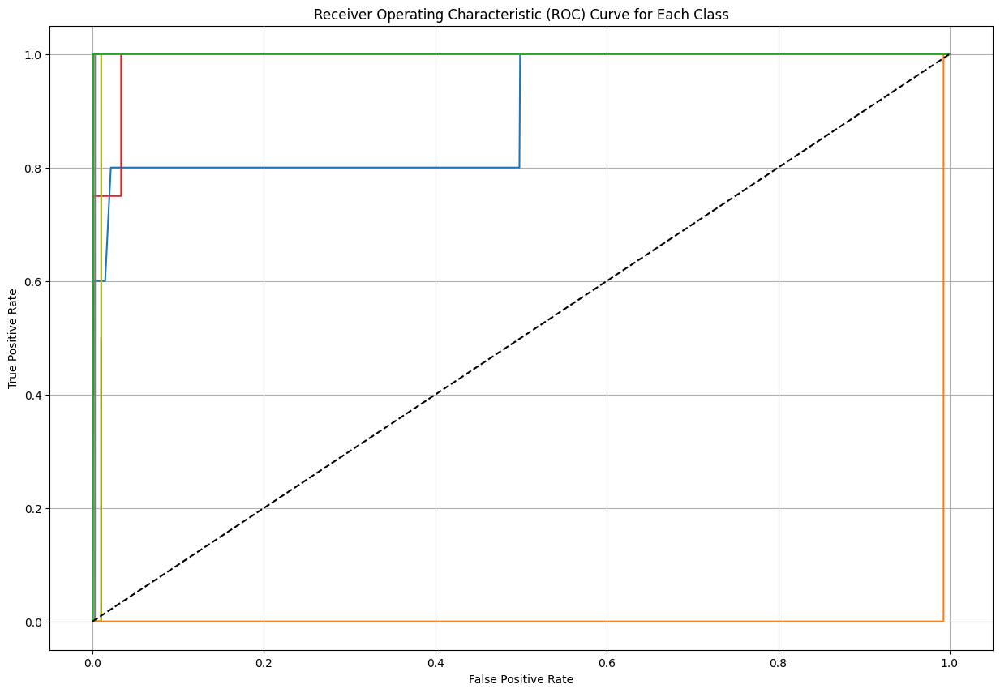

In [26]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import numpy as np

# Assuming you have your model predictions and true labels
# target_test contains true labels and target_predP contains predicted probabilities for each class

# Number of classes
n_classes = 33  # Adjust this to match your number of classes

# Binarize the true labels
y_test_bin = label_binarize(target_test, classes=np.arange(n_classes))

# Initialize dictionaries to store false positive rate, true positive rate, and area under the curve for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

# Compute ROC curve and ROC area for each class
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], target_predP[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(15, 10))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (area = {roc_auc[i]:.2f})')

# Plot the diagonal line for random guessing
plt.plot([0, 1], [0, 1], 'k--')

# Add plot details
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class')
#plt.legend(loc='best')
plt.grid(True)
plt.show()


In [27]:
# Get attention weights for test data
input_layer = modelN.layers[1].input
print(input_layer)
attention_weights = modelN.layers[4].output # Replace index_of_attention_layer with the correct index
attention_model = Model(inputs=input_layer, outputs=attention_weights)
batch_size = 16  # Start with a smaller batch size
attention_weights = attention_model.predict(data_test, batch_size=batch_size)

print(attention_weights)

<KerasTensor shape=(None, 50), dtype=float32, sparse=None, name=keras_tensor>
2950/2950 ━━━━━━━━━━━━━━━━━━━━ 15s 5ms/step
[[[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 ...

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]]


In [28]:
import numpy as np

# Calculate the mean attention weight for each time step across all samples
mean_attention_weights = np.mean(attention_weights, axis=0)
print(mean_attention_weights)
# Find the positions with the highest mean attention weights
top_positions = np.argsort(mean_attention_weights)[::-1]  # Sort positions in descending order of attention weights

# Print the top positions with their corresponding mean attention weights
print("Top positions with highest mean attention weights:")
for i, position in enumerate(top_positions):
    print(f"Position: {position}, Mean Attention Weight: {mean_attention_weights[position]}")


[[4.13277119e-01]
 [9.19716200e-04]
 [1.36216665e-02]
 [2.67833602e-05]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]]
Top positions with highest mean attention weights:
Position: [0], Mean Attention Weight: [[0.413277

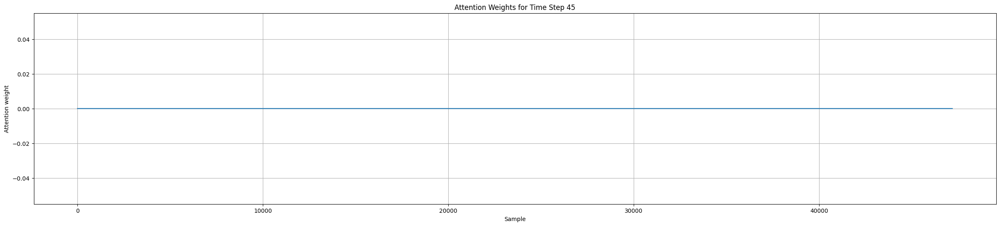

In [29]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have obtained attention weights for a specific time step
# Let's say the attention weights are stored in the variable attention_weights
# The shape of attention_weights is (6604, 299, 1)

# Choose a specific time step to visualize
time_step = 45  # Adjust this as needed

# Extract attention weights for the chosen time step
attention_weights_timestep = attention_weights[:, time_step]
# Plot the attention weights
plt.figure(figsize=(30, 6))
plt.plot(attention_weights_timestep)
plt.xlabel('Sample')
plt.ylabel('Attention weight')
plt.title(f'Attention Weights for Time Step {time_step}')
plt.grid(True)
plt.show()


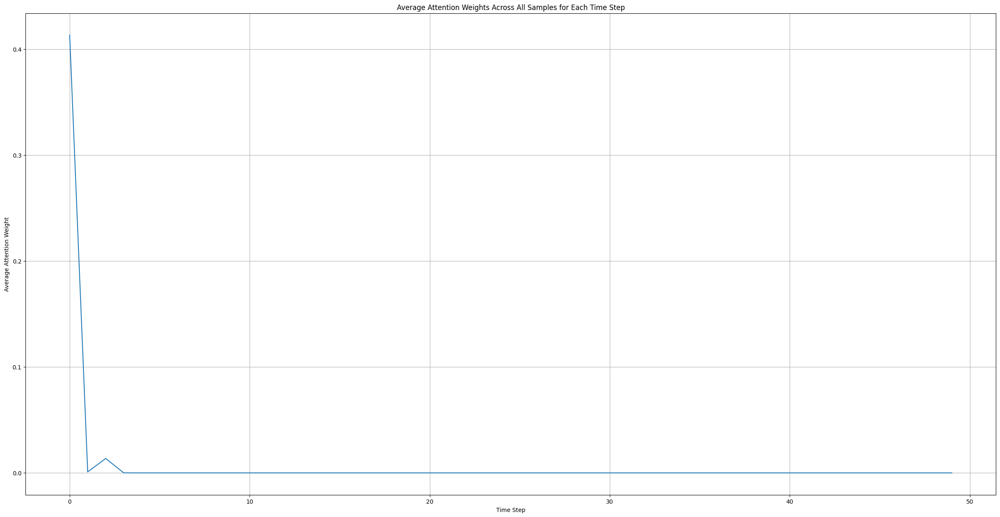

In [30]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have obtained attention weights for all time steps
# Let's say the attention weights are stored in the variable attention_weights
# The shape of attention_weights is (6604, 299, 1)

# Remove the last dimension as it's not needed for averaging
attention_weights = attention_weights.squeeze()  # Now the shape is (6604, 299)

# Calculate the average attention weight for each time step
average_attention_weights = np.mean(attention_weights, axis=0)

# Plot the average attention weights
plt.figure(figsize=(30, 15))
plt.plot(average_attention_weights)
plt.xlabel('Time Step')
plt.ylabel('Average Attention Weight')
plt.title('Average Attention Weights Across All Samples for Each Time Step')
plt.grid(True)
#plt.savefig('/home/dell15/Pragya/Objective3_new/attention-weight.png', dpi=500) 
plt.show()


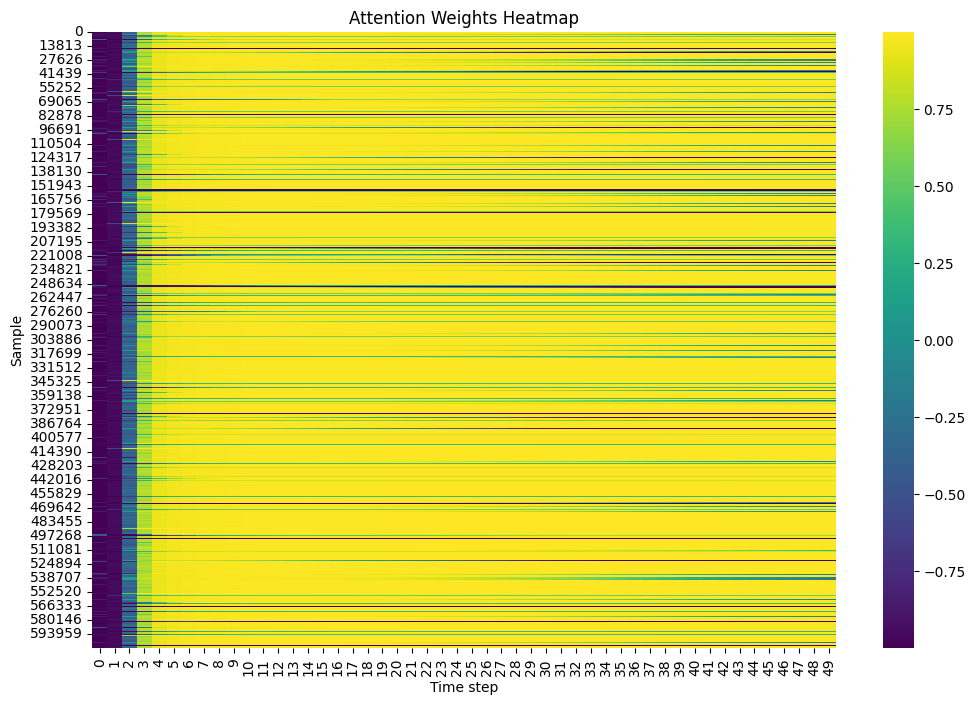

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Reshape attention weights to 2D
attention_weights_2d = attention_weights.reshape((attention_weights.shape[0], attention_weights.shape[1]))

# Plot the attention weights as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(attention_weights_2d, cmap='viridis')
plt.xlabel('Time step')
plt.ylabel('Sample')
plt.title('Attention Weights Heatmap')
plt.savefig('/home/dell15/Pragya/Objective3_new/correlation-plot-attention.png', dpi=500)
plt.show()


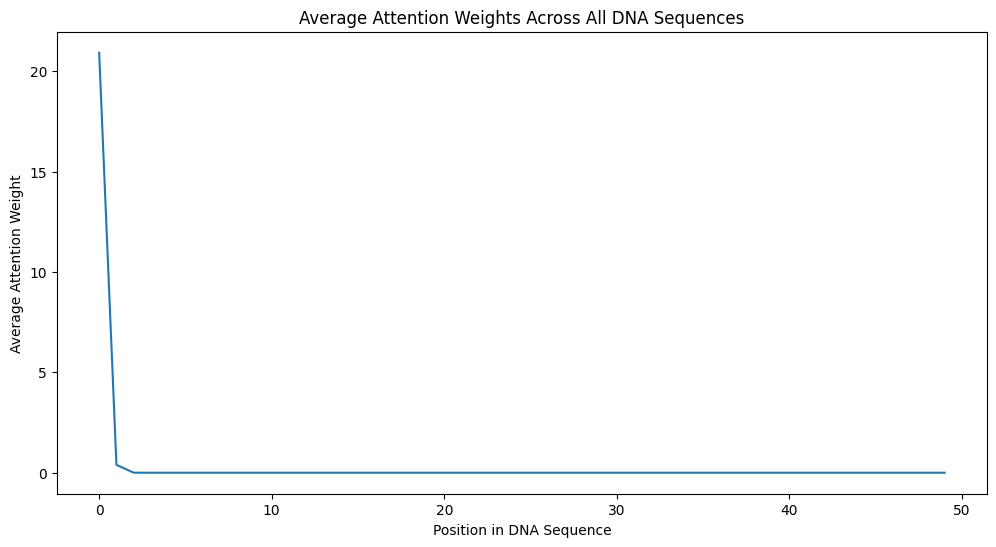

In [68]:
import numpy as np
#import torch

all_attention_weights = np.stack(attention_weights)

# Compute average attention weight for each position
avg_attention_weights = np.mean(attention_weights, axis=0)

# Visualize average attention weights as a line plot
plt.figure(figsize=(12, 6))
plt.plot(avg_attention_weights)
plt.title("Average Attention Weights Across All DNA Sequences")
plt.xlabel("Position in DNA Sequence")
plt.ylabel("Average Attention Weight")
plt.show()

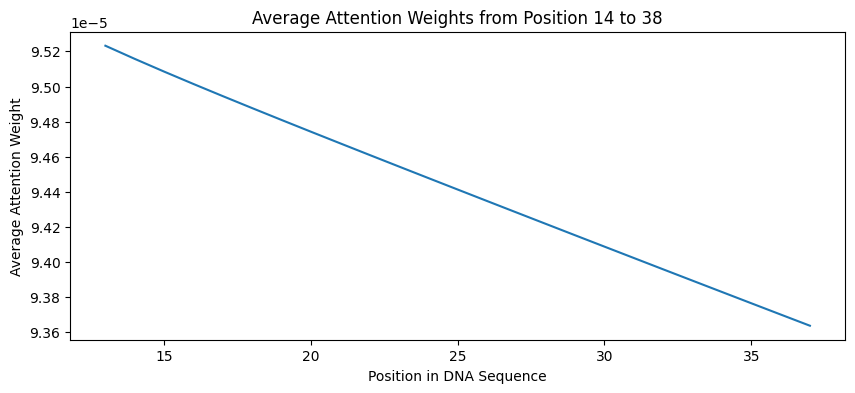

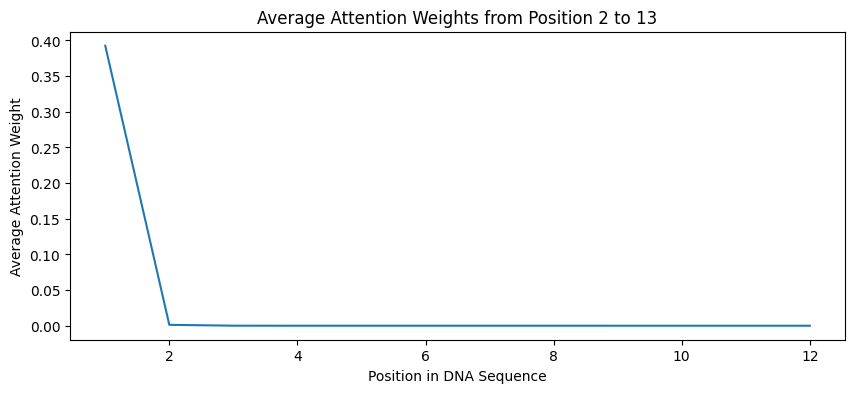

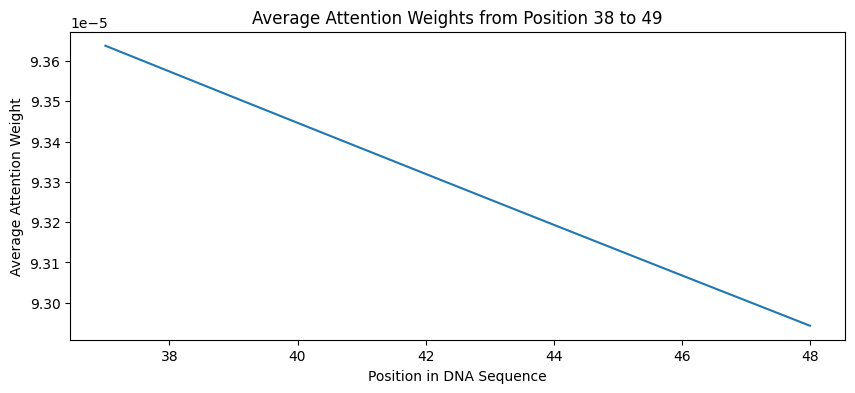

In [69]:
#segments = [(0, 20), (20, 30), (30, 50), (50, 70), (70, 100), (100, 140), (140, 170), (170, 200), (200, 290)]
segments = [(13, 38), (1,13), (37, 49)]
# Plot each segment
for start, end in segments:
    plt.figure(figsize=(10, 4))
    plt.plot(range(start, end), avg_attention_weights[start:end])
    plt.title(f"Average Attention Weights from Position {start+1} to {end}")
    plt.xlabel("Position in DNA Sequence")
    plt.ylabel("Average Attention Weight")
    plt.show()

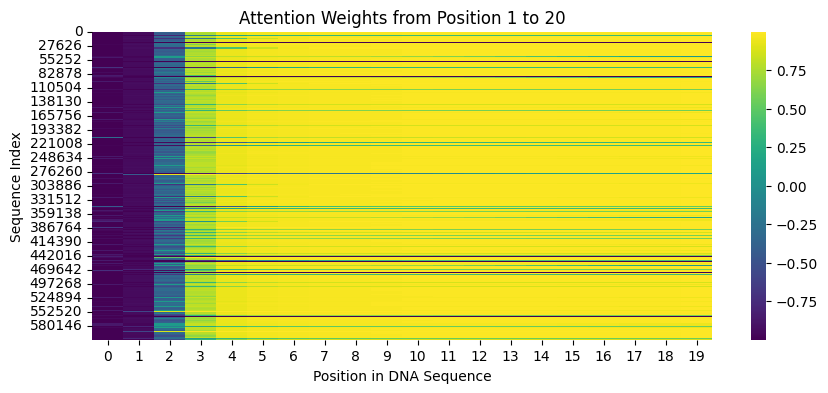

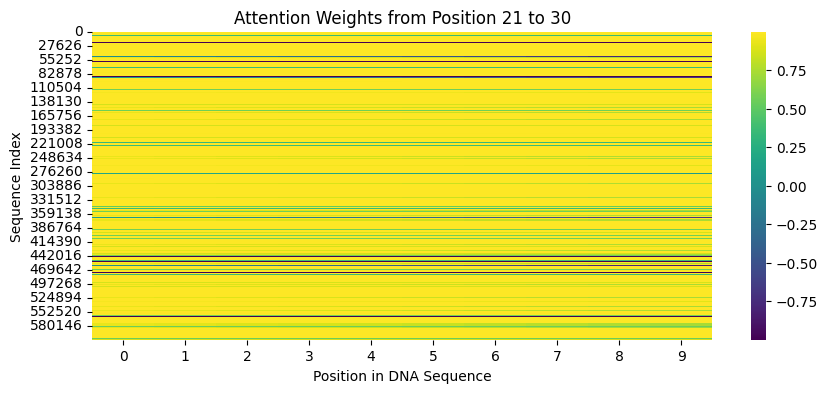

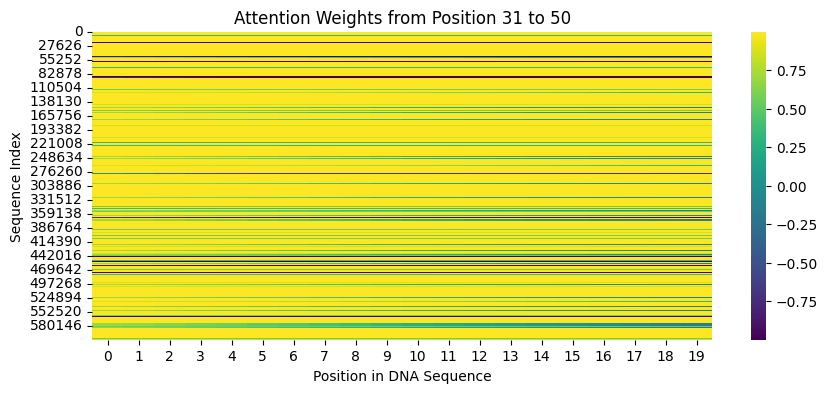

In [39]:
# Define the segment ranges
segments = [(0, 20), (20, 30), (30, 50)]

# Plot each segment as a heatmap
for start, end in segments:
    plt.figure(figsize=(10, 4))
    segment_weights = attention_weights[:, start:end]
    
    # Create a heatmap for the segment
    sns.heatmap(segment_weights, cmap='viridis', cbar=True)
    plt.title(f"Attention Weights from Position {start+1} to {end}")
    plt.xlabel("Position in DNA Sequence")
    plt.ylabel("Sequence Index")
    plt.show()


In [75]:
# Assuming you have obtained attention weights for each input sequence
# Let's say attention_weights is a list of numpy arrays, where each array corresponds to attention weights for one input sequence

# Sort attention weights for each class
sorted_attention_weights = {}
for class_label in range(num_classes):
    class_attention_weights = []  # Store attention weights for this class
    for i, attn_weights in enumerate(attention_weights):
        # Get the predicted class probabilities for input i
        predicted_probs = model.predict(np.expand_dims(data_test[i], axis=0))[0]
        # Get the predicted class index (the one with the highest probability)
        predicted_class = np.argmax(predicted_probs)
        # Check if the predicted class matches the current class label
        if predicted_class == class_label:
            class_attention_weights.append(attn_weights)
    sorted_attention_weights[class_label] = sorted(class_attention_weights, key=lambda x: np.max(x), reverse=True)

# Extract top-K subsequences for each class
top_k_subsequences = {}
for class_label, class_weights in sorted_attention_weights.items():
    top_k_subsequences[class_label] = [data_test[i][np.argmax(weights)] for weights in class_weights[:K]]

# Visualization or further analysis
# You can visualize or analyze these top-K subsequences to understand the important features for each class


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

KeyboardInterrupt: 

In [31]:
import numpy as np

# Example data (replace these with actual data from your model)
#sequences = ['ACGT', 'TGCA', 'CAGT', 'GTCA', 'TACG', 'ACGT', 'TGCA', 'CAGT', 'GTCA', 'TACG']
attention_weights = np.random.rand(len(data), len(data[0]))  # Example attention weights

# Number of top sequences to find
k = 3

# Compute scores (sum of attention weights for each sequence)
sequence_scores = attention_weights.sum(axis=1)

# Get indices of top-k sequences
top_k_indices = np.argsort(sequence_scores)[-k:][::-1]

# Get top-k sequences and their attention weights
top_k_sequences = [data[i] for i in top_k_indices]
top_k_attention_weights = attention_weights[top_k_indices]

print("Top-k Sequences:")
for seq, score in zip(top_k_sequences, sequence_scores[top_k_indices]):
    print(f"Sequence: {seq}, Score: {score}")

Top-k Sequences:
Sequence: ATTTAGCAAGAAGAGACCTCGTTCTTTCCATCAAATAGTGTGGTGTAATT, Score: 34.64846646862594
Sequence: CTTCTGGCACCCAGGACTGTGGAACATACATTTCTAGTGTTTTAAGCCAC, Score: 33.9831180635639
Sequence: ATCTAAGGGCTGTTTTATTTTTTCGCTTTTTGTGAGTGCTGCTTTTTTGT, Score: 33.90047401129097


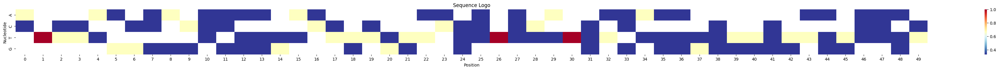

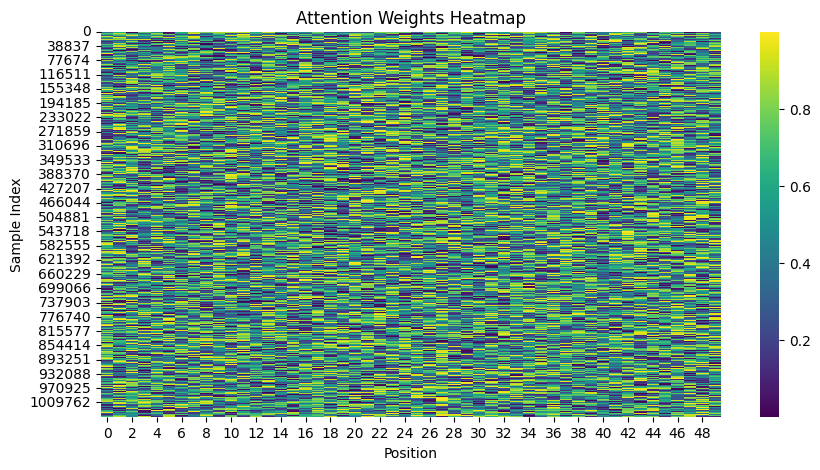

Top-K features: [28 19 33  1 35  6 27 49 37 45]


In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

# Function to generate sequence logo
def generate_sequence_logo(subsequences, title):
    sequence_length = len(subsequences[0])
    counts = [Counter(seq) for seq in zip(*subsequences)]
    proportions = [{nt: count / len(subsequences) for nt, count in seq_count.items()} for seq_count in counts]
    logo_data = pd.DataFrame(proportions)
    fig, ax = plt.subplots(figsize=(sequence_length, 2))
    sns.heatmap(logo_data.transpose(), cmap='RdYlBu_r', ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Position')
    ax.set_ylabel('Nucleotide')
    plt.savefig('/home/dell15/Pragya/analysis/sequence-logo-insertion.png', dpi=500)
    plt.show()

# Function to generate heatmap of attention weights
def generate_heatmap(attention_weights, title):
    fig, ax = plt.subplots(figsize=(10, 5))
    sns.heatmap(attention_weights, cmap='viridis', ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Position')
    ax.set_ylabel('Sample Index')
    plt.savefig('/home/dell15/Pragya/analysis/attention-heatmap-insertion.png', dpi=500)
    plt.show()

# Function to rank feature importance based on attention weights
def rank_feature_importance(attention_weights, k):
    average_attention = attention_weights.mean(axis=0)
    sorted_indices = np.argsort(average_attention)[::-1][:k]
    return sorted_indices

# Example usage
top_k_subsequences = ['ATTTAGCAAGAAGAGACCTCGTTCTTTCCATCAAATAGTGTGGTGTAATT', 'CTTCTGGCACCCAGGACTGTGGAACATACATTTCTAGTGTTTTAAGCCAC', 'ATCTAAGGGCTGTTTTATTTTTTCGCTTTTTGTGAGTGCTGCTTTTTTGT'] # List of top-K subsequences for each class
#attention_weights = ...   # Attention weights for each position in the sequences

# Visualize sequence logo
generate_sequence_logo(top_k_subsequences, title='Sequence Logo')

# Visualize heatmap of attention weights
generate_heatmap(attention_weights, title='Attention Weights Heatmap')

# Rank feature importance
k = 10  # Top-K features to visualize
top_features = rank_feature_importance(attention_weights, k)
print("Top-K features:", top_features)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def generate_heatmap(attention_weights, top_k_indices, title):
    # Select attention weights for the top-K positions
    selected_attention = attention_weights[:, top_k_indices]
    
    # Create a heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(selected_attention, cmap='viridis', annot=True)
    plt.title(title)
    plt.xlabel('Top-K Features')
    plt.ylabel('Sequence Index')
    plt.savefig('/home/dell15/Pragya/analysis/attention-heatmap-insertion.png', dpi=500)
    plt.show()

# Assuming attention_weights is a numpy array of shape (num_sequences, seq_length)
generate_heatmap(attention_weights, top_k_indices=[28, 19, 33, 1, 35 , 6, 27, 49, 37, 45], title='Top-K Feature Attention Weights Heatmap')


In [81]:
import shap
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model

# Disable eager execution
tf.compat.v1.disable_eager_execution()

# Load the model
# modelN = load_model("/home/dell15/Pragya/Objective3_new/Training-Datasets/model-Del-CWs.keras")

# Convert data to NumPy arrays if they are not already
data_train_np = np.array(data_train)
data_test_np = np.array(data_test)

# Sample data
data_train_sample = shap.sample(data_train_np, 200, random_state=42)
data_test_sample = shap.sample(data_test_np, 200, random_state=42)

# Define a prediction function that works with KernelExplainer
def model_predict(data):
    return modelN(data).numpy()

# Initialize the KernelExplainer
explainer = shap.KernelExplainer(model_predict, data_train_sample)

# Compute SHAP values
shap_values = explainer.shap_values(data_test_sample)

# Visualize SHAP values for a single input
input_idx = 0
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][input_idx], data_test_sample[input_idx])


Provided model function fails when applied to the provided data set.


RuntimeError: Exception encountered when calling Embedding.call().

[1mresource: Attempting to capture an EagerTensor without building a function.[0m

Arguments received by Embedding.call():
  • inputs=tf.Tensor(shape=(200, 50), dtype=float32)

In [ ]:
# Compute average SHAP values for each position
avg_shap_values = np.mean(shap_values[0], axis=0)

# Define segments and plot
segments = [(0, 20), (20, 30), (30, 50), (50, 70), (70, 100)]

for start, end in segments:
    segment_values = avg_shap_values[start:end]
    plt.figure(figsize=(10, 4))
    plt.plot(range(start + 1, end + 1), segment_values)
    plt.xlabel('Position in DNA Sequence')
    plt.ylabel('Average SHAP Value')
    plt.title(f'SHAP Values from Position {start+1} to {end}')
    plt.show()


157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step
[('TCCTCTGGGGAAAGAGTGGCCTAAAGTGTCTTTGATTGTAACTATGGGAAAGACTTTCATCCGCACTCTTTACGAGGTTAATTGTAACTCTCCCCCAAGCTCAGGGACGCTTTCCTGAGTCTTGTGGCTGTAATCTTACACGTTGCGTGATAAACTTTCATTTTCCAACGAGGACATTCCAAAATGTTAAAAGTCATGGCTCCAAAAACAGTCAAATGAGTGAAAGCTGATAAGAAACTGGTTTAGCTAGTGCATACATGCACACGTGTGCACACAGCCTGCCGTCCTCCAGCTACACCAAGTGAAAGTCCTCAAGTTTCATCAGGAACGATCCCACA', 3.7577822798714976e-33)]


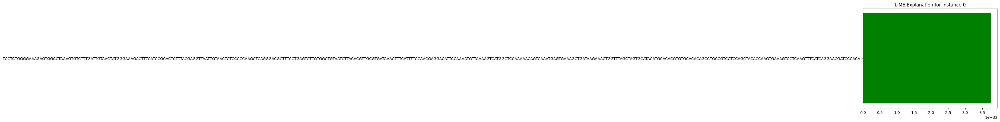

In [30]:
import lime
import lime.lime_text
from lime.lime_text import LimeTextExplainer
# LIME explanation
class_names = label_encoder.classes_
explainer = LimeTextExplainer(class_names=class_names)

# Function to make predictions using the trained model
def predict_proba(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=max_seq_length, padding='post')
    return model.predict(padded_sequences)

# Choose an instance to explain
instance_idx = 0
instance_text = [data[instance_idx]]

# Generate LIME explanation for the instance
exp = explainer.explain_instance(instance_text[0], predict_proba, num_features=10)

# Show the explanation in text
print(exp.as_list())

# Plot the explanation
exp.as_pyplot_figure()
plt.title(f'LIME Explanation for Instance {instance_idx}')
plt.show()

Skipping instance 0 because it contains no valid tokens.
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step
Explanation for instance 1:
[('caagcacaaacaaatcaggctaaatccttctgcgtgtgggtctgtgagggtagcagctcatgttgtggccagaaacttggtaatatgattgagaaaactaaaaacacattttaagtgaagtcctggggtgcacacagcattctgctttaagatactgactgtttttgaaataaaactttaaaacatgccataaaaagcaactattcctctggggaaagagtggcctaaagtgtctttgattgtaactatgggaaagactttcatccgcactctttacgaggttaattgtaactctcccccaagctcaggg', -0.001013253677744294)]


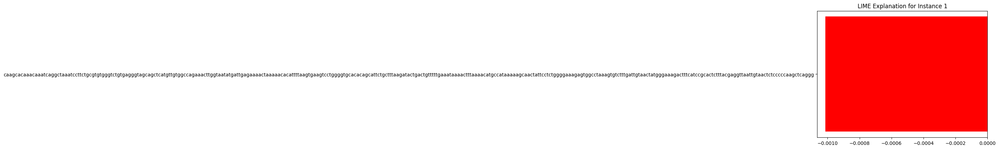

157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step
Explanation for instance 2:
[('caagcacaaacaaatcaggctaaatccttctgcgtgtgggtctgtgagggtagcagctcatgttgtggccagaaacttggtaatatgattgagaaaactaaaaacacattttaagtgaagtcctggggtgcacacagcattctgctttaagatgctgactgtttttgaaataaaactttaaaacatgccataaaaagcaactattcctctggggaaagagtggcctaaagtgtctttgattgtaactatgggaaagactttcatccgcactctttacgaggttaattgtaactctcccccaagctcaggg', -0.0010132604881382943)]


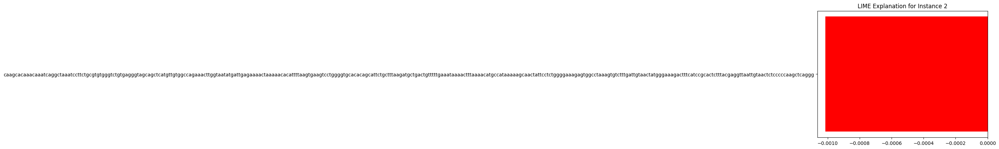

Skipping instance 3 because it contains no valid tokens.
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step
Explanation for instance 4:
[('ctcctgcaagaaaggattaaagtgaagcaa', -0.0010132603366268655)]


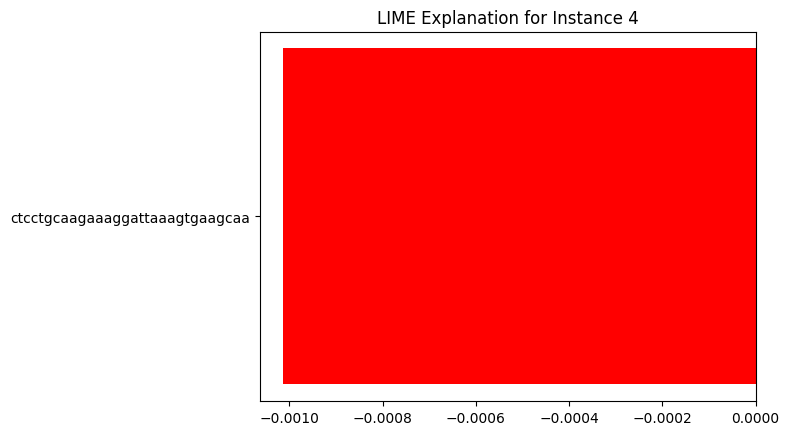

157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step
Explanation for instance 5:
[('ctcctgcaagaaaggattaaagtgaagcaaaaagaacatgtaataagatgaataatgaatagaaaaataatttgctcttaagacaaagtaaaggaaactataaaagggagatgactagaactatttagcaagaagagacctcgttctttccatcaaatagtgtggtgtaatttgcacaatgcacccaatggttaatgaatacatatttgttgaggatagcattaataaatagatgaccaaagaaaaactaatacaaaagatttttacccttcaggaagtaactattaggtaggt', -0.0010132603717312133)]


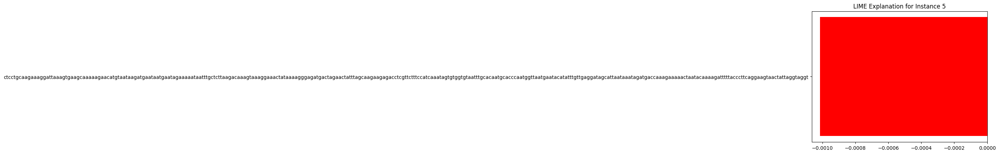

157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step
Explanation for instance 6:
[('acctggagtctgcagagctggaaagggaaaggaagatcccccaaccagtgtctttggagggggtgcagccctgcccacaccttgatgttgaacttctggcacccaggactgtggaacatacatttctagtgttttaagccaccaagctcgtggtaatttgttatggcagccatgggaaacgaatacaggtctcgatgaagtaacaagcctccagctatcctttgtttaccgctt', -0.0010132604705436392)]


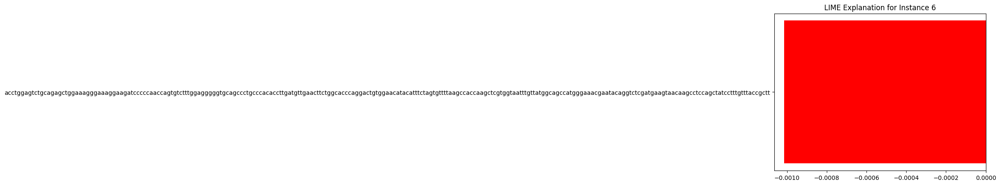

 31/157 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step

KeyboardInterrupt: 

In [32]:
# LIME explanation
class_names = label_encoder.classes_
explainer = LimeTextExplainer(class_names=class_names)

# Function to make predictions using the trained model
def predict_proba(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=max_seq_length, padding='post')
    return model.predict(padded_sequences)

# Generate LIME explanations for all instances in the test set
for instance_idx in range(len(data_test)):
    instance_text = tokenizer.sequences_to_texts([data_test[instance_idx]])
    
    # Ensure the instance text is not empty
    if not instance_text[0].strip():
        print(f"Skipping instance {instance_idx} because it contains no valid tokens.")
        continue
    
    # Generate LIME explanation for the instance
    exp = explainer.explain_instance(instance_text[0], predict_proba, num_features=10)
    
    # Print the explanation
    print(f"Explanation for instance {instance_idx}:")
    print(exp.as_list())
    
    # Plot the explanation
    exp.as_pyplot_figure()
    plt.title(f'LIME Explanation for Instance {instance_idx}')
    plt.show()


In [44]:
print(len(target_test))


364656


In [94]:
from collections import Counter
import lime
import lime.lime_text
from lime.lime_text import LimeTextExplainer
# LIME explanation
class_names = label_encoder.classes_
explainer = LimeTextExplainer(class_names=class_names)

# Function to make predictions using the trained model
def predict_proba(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=max_seq_length, padding='post')
    return model.predict(padded_sequences)

# Dictionary to store feature importance counts
feature_counts = Counter()

# Generate LIME explanations for all instances in the test set
for instance_idx in range(0,2000):
    instance_text = tokenizer.sequences_to_texts([data_test[instance_idx]])
    
    # Ensure the instance text is not empty
    if not instance_text[0].strip():
        print(f"Skipping instance {instance_idx} because it contains no valid tokens.")
        continue
    
    # Generate LIME explanation for the instance
    exp = explainer.explain_instance(instance_text[0], predict_proba, num_features=10)
    
    # Aggregate feature importances
    for feature, weight in exp.as_list():
        feature_counts[feature] += weight

# Create a DataFrame from the feature_counts
feature_importances = pd.DataFrame(feature_counts.items(), columns=['Feature', 'Importance'])
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Plot the aggregated feature importances
plt.figure(figsize=(10, 8))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importance')
plt.title('Aggregated Feature Importances from LIME Explanations')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.show()


AttributeError: in user code:

    File "/tmp/ipykernel_641593/3956728678.py", line 15, in predict_proba  *
        tf.compat.v1.keras.backend.set_session(sess)

    AttributeError: module 'keras._tf_keras.keras.backend' has no attribute 'set_session'


In [91]:
import shap
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from lime.lime_text import LimeTextExplainer
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


# Convert numpy arrays to list of strings
data_train_list = [str(item) for item in data_train.tolist()]

# Example tokenizer and max sequence length
tokenizer = Tokenizer(num_words=10000)
max_seq_length = 200

# Fit tokenizer on training data
tokenizer.fit_on_texts(data_train_list)

# Define a prediction function for LIME
def predict_proba(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=max_seq_length, padding='post')
    with tf.compat.v1.Session() as sess:
        tf.compat.v1.keras.backend.set_session(sess)
        return modelN.predict(padded_sequences)

# Sample data for LIME explanation
data_train_sample = shap.sample(data_train, 200, random_state=42)
data_test_sample = shap.sample(data_test, 200, random_state=42)

# Initialize LIME explainer
explainer = LimeTextExplainer(class_names=[str(i) for i in range(88)])

# Convert instance_text to string
instance_text_str = "Your instance text here"  # Replace with your instance text

# Generate LIME explanation for a sample instance
exp = explainer.explain_instance(instance_text_str, predict_proba, num_features=10)

# Visualize the explanation
exp.show_in_notebook()


AttributeError: module 'keras._tf_keras.keras.backend' has no attribute 'set_session'

In [92]:
plt.savefig('/home/dell15/Pragya/Objective3_new/lime-importance.png', dpi=1500)

<Figure size 640x480 with 0 Axes>

Class                                                     AA
Feature                                                     
aacaggtttagctagtgcatacatgcacacgtgtgcacacagcctgc... -0.000871
aactgagaaacagcagagaggaagtagaaaggtggaaaaatgaggag... -0.000870
aactgagaaacagccagagaggaaatagaaaggtggaaaaatgagga... -0.000871
aactgagaaacagccagagaggaagtagaaaggtggaaaaatgagga... -0.000871
aactgagaaacagccagagaggaagtagaaaggtggaaaaatgagga... -0.000871
...                                                      ...
ttggatcatattcgtccacaaaatgattctgaattagctgtatcgtc... -0.006095
ttggatcatattcgtccacaaaatgattctgaattagctgtatcgtc... -0.004353
ttgtggatgaatactgccatttgtcattaggattgatgacagactgt... -0.001741
tttgagctgacccataaatacaacaggaagacacagagtaacaatta... -0.000871
tttggtgtttcgtcctttccacaag                          -0.002612

[1251 rows x 1 columns]


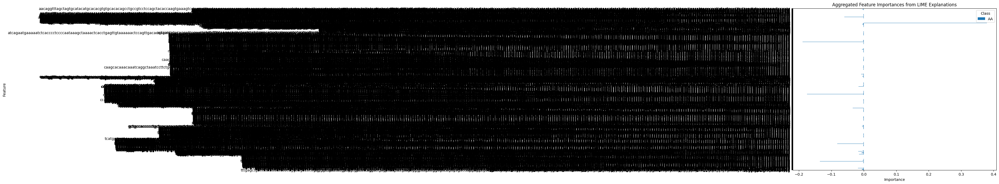

In [90]:
print(feature_importances)

# Plot the aggregated feature importances for each class
feature_importances.plot(kind='barh', figsize=(10, 8))
plt.xlabel('Importance')
plt.title('Aggregated Feature Importances from LIME Explanations')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.show()


In [86]:
feature_importances.to_csv('/home/dell15/Pragya/Objective3_new/Importance-score.csv')

In [ ]:
# Plot the aggregated feature importances for each class
feature_importances.plot(kind='barh', figsize=(10, 8))
plt.xlabel('Importance')
plt.title('Aggregated Feature Importances from LIME Explanations')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.show()


In [80]:
import pandas as pd
from collections import defaultdict

# Create an empty DataFrame with columns as class names
class_names = label_encoder.classes_
feature_importances_df = pd.DataFrame(columns=class_names)

# Dictionary to store feature importance counts for each class
feature_importances = defaultdict(lambda: defaultdict(float))

# Generate LIME explanations for all instances in the test set
for instance_idx in range(0, 2000):
    instance_text = tokenizer.sequences_to_texts([data_test[instance_idx]])
    
    # Ensure the instance text is not empty
    if not instance_text[0].strip():
        print(f"Skipping instance {instance_idx} because it contains no valid tokens.")
        continue
    
    # Generate LIME explanation for the instance
    exp = explainer.explain_instance(instance_text[0], predict_proba, num_features=10)
    
    # Aggregate feature importances for each class
    for class_index, class_name in enumerate(class_names):
        for feature, importance in exp.as_list(label=class_index):
            feature_importances[feature][class_name] += importance

# Fill the DataFrame with importance scores
for feature, importance_scores in feature_importances.items():
    feature_importances_df.loc[feature] = pd.Series(importance_scores)

# Fill NaN values with 0
feature_importances_df = feature_importances_df.fillna(0)

# Display the DataFrame
print(feature_importances_df)


Skipping instance 0 because it contains no valid tokens.
157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step


KeyError: 0

defaultdict(<function <lambda> at 0x7f02230ef790>, {'caagcacaaacaaatcaggctaaatccttctgcgtgtgggtctgtgagggtagcagctcatgttgtggccagaaacttggtaatatgattgagaaaactaaaaacacattttaagtgaagtcctggggtgcacacagcattctgctttaagatactgactgtttttgaaataaaactttaaaacatgccataaaaagcaactattcctctggggaaagagtggcctaaagtgtctttgattgtaactatgggaaagactttcatccgcactctttacgaggttaattgtaactctcccccaagctcaggg': defaultdict(<class 'float'>, {'AA': -0.0026119830640098044})})


In [21]:
import lime
import lime.lime_text
from sklearn.pipeline import make_pipeline

# Create a function to predict from raw text
class TextModelWrapper:
    def __init__(self, model, tokenizer, max_seq_length):
        self.model = model
        self.tokenizer = tokenizer
        self.max_seq_length = max_seq_length

    def predict(self, texts):
        sequences = self.tokenizer.texts_to_sequences(texts)
        padded_sequences = pad_sequences(sequences, maxlen=self.max_seq_length, padding='post')
        return self.model.predict(padded_sequences)

# Wrap your model
wrapped_model = TextModelWrapper(model, tokenizer, max_seq_length)

# Create a LIME text explainer
explainer = lime.lime_text.LimeTextExplainer(class_names=label_encoder.classes_)

# Choose an instance to explain
text_instance = data[0]  # Use the first instance in the data

# Explain the instance
exp = explainer.explain_instance(text_instance, wrapped_model.predict, num_features=10)

# Display the explanation
exp.show_in_notebook(text=True)


AttributeError: 'Functional' object has no attribute 'predict_proba'

In [27]:
import lime
from lime.lime_text import LimeTextExplainer

# Function to make predictions using your Keras model
def predict_function(texts):
    # Preprocess the texts (tokenization, padding, etc.)
    data_seq = tokenizer.texts_to_sequences(texts)
    data_padded = pad_sequences(data_seq, maxlen=max_seq_length, padding='post')
    
    # Make predictions using the Keras model
    predictions = model.predict(data_padded)
    
    return predictions

# Initialize LimeTextExplainer
explainer = LimeTextExplainer()

# Iterate over each data instance
for i, text_instance in enumerate(data):
    # Generate explanation for the current instance
    explanation = explainer.explain_instance(text_instance, predict_function, num_features=10)
    
    # Show explanation
    print(f"Explanation for instance {i + 1}:")
    explanation.show_in_notebook(text=text_instance)


Explanation for instance 1:


Explanation for instance 2:


Explanation for instance 3:


Explanation for instance 4:


Explanation for instance 5:


Explanation for instance 6:


Explanation for instance 7:


Explanation for instance 8:


KeyboardInterrupt: 

In [33]:
import numpy as np
print(np.__version__)


1.19.5


In [34]:
!pip install --upgrade --force-reinstall numpy

  Using cached numpy-1.24.4-cp38-cp38-win_amd64.whl (14.9 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.4
    Uninstalling numpy-1.24.4:
      Successfully uninstalled numpy-1.24.4


ERROR: Could not install packages due to an EnvironmentError: [WinError 5] Access is denied: 'C:\\Users\\pragy\\AppData\\Local\\Programs\\Python\\Python38\\Lib\\site-packages\\~~mpy\\.libs\\libopenblas64__v0.3.21-gcc_10_3_0.dll'
Consider using the `--user` option or check the permissions.

You should consider upgrading via the 'c:\users\pragy\appdata\local\programs\python\python38\python.exe -m pip install --upgrade pip' command.


In [25]:
import numpy as np
import shap

data_train_array = np.array(data_train)
data_test_array = np.array(data_test)

print(f"Shape of data_train_array: {data_train_array.shape}")
print(f"Shape of data_test_array: {data_test_array.shape}")
# Since the model expects 3D inputs, reshape the data appropriately
# For LSTM: (samples, timesteps, features), here features are embedding dimensions
data_train_reshaped = data_train_array.reshape(data_train_array.shape[0], data_train_array.shape[1], 1)
data_test_reshaped = data_test_array.reshape(data_test_array.shape[0], data_test_array.shape[1], 1)

# Print the shapes of the reshaped arrays to verify
print(f"Shape of data_train_reshaped: {data_train_reshaped.shape}")
print(f"Shape of data_test_reshaped: {data_test_reshaped.shape}")

# Use SHAP to explain the model's predictions with GradientExplainer
explainer = shap.DeepExplainer(model, data_train_array[:100])
shap_values = explainer.shap_values(data_test_array[:10])

# Plot the SHAP values for the first prediction
shap.summary_plot(shap_values, data_test_array[:10])

# Visualize the first prediction's explanation
#shap.summary_plot(shap_values, data_test[:10], feature_names=tokenizer.index_word)


Shape of data_train_array: (1701723, 299)
Shape of data_test_array: (364656, 299)
Shape of data_train_reshaped: (1701723, 299, 1)
Shape of data_test_reshaped: (364656, 299, 1)


AttributeError: in user code:

    File "c:\users\pragy\appdata\local\programs\python\python38\lib\site-packages\shap\explainers\_deep\deep_tf.py", line 254, in grad_graph  *
        out = self.model(shap_rAnD)
    File "c:\users\pragy\appdata\local\programs\python\python38\lib\site-packages\keras\utils\traceback_utils.py", line 70, in error_handler  **
        raise e.with_traceback(filtered_tb) from None
    File "c:\users\pragy\appdata\local\programs\python\python38\lib\site-packages\shap\explainers\_deep\deep_tf.py", line 385, in custom_grad
        out = op_handlers[type_name](self, op, *grads) # we cut off the shap_ prefix before the lookup
    File "c:\users\pragy\appdata\local\programs\python\python38\lib\site-packages\shap\explainers\_deep\deep_tf.py", line 674, in handler
        return linearity_with_excluded_handler(input_inds, explainer, op, *grads)
    File "c:\users\pragy\appdata\local\programs\python\python38\lib\site-packages\shap\explainers\_deep\deep_tf.py", line 681, in linearity_with_excluded_handler
        assert not explainer._variable_inputs(op)[i], str(i) + "th input to " + op.name + " cannot vary!"
    File "c:\users\pragy\appdata\local\programs\python\python38\lib\site-packages\shap\explainers\_deep\deep_tf.py", line 231, in _variable_inputs
        out[i] = t.name in self.between_tensors

    AttributeError: Exception encountered when calling layer "lstm" "                 f"(type LSTM).
    
    'TFDeep' object has no attribute 'between_tensors'
    
    Call arguments received by layer "lstm" "                 f"(type LSTM):
      • inputs=tf.Tensor(shape=(200, 299, 100), dtype=float32)
      • mask=None
      • training=False
      • initial_state=None


In [87]:
import numpy as np
import shap

# Ensure data_train and data_test are NumPy arrays
data_train_array = np.array(data_train)
data_test_array = np.array(data_test)

# Print the shapes of the arrays to verify
print(f"Shape of data_train_array: {data_train_array.shape}")
print(f"Shape of data_test_array: {data_test_array.shape}")

# Reshape the data as required for LSTM (samples, timesteps, features)
data_train_reshaped = data_train_array.reshape(data_train_array.shape[0], data_train_array.shape[1], 1)
data_test_reshaped = data_test_array.reshape(data_test_array.shape[0], data_test_array.shape[1], 1)

# Print the shapes of the reshaped arrays to verify
print(f"Shape of data_train_reshaped: {data_train_reshaped.shape}")
print(f"Shape of data_test_reshaped: {data_test_reshaped.shape}")

# Flatten the data to 2D for KernelExplainer
data_train_flattened = data_train_reshaped.reshape(data_train_reshaped.shape[0], -1)
data_test_flattened = data_test_reshaped.reshape(data_test_reshaped.shape[0], -1)

# Define a prediction function that reshapes the input back to 3D
def model_predict(data):
    data_reshaped = data.reshape(data.shape[0], 299, 1)
    return model.predict(data_reshaped)

# Use SHAP to explain the model's predictions with KernelExplainer
explainer = shap.KernelExplainer(model_predict, data_train_flattened[:100])
shap_values = explainer.shap_values(data_test_flattened[:10])

# Plot the SHAP values for the first prediction
shap.summary_plot(shap_values, data_test_flattened[:10])


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


Shape of data_train_array: (1701723, 299)
Shape of data_test_array: (364656, 299)
Shape of data_train_reshaped: (1701723, 299, 1)
Shape of data_test_reshaped: (364656, 299, 1)
Provided model function fails when applied to the provided data set.


ValueError: as_list() is not defined on an unknown TensorShape.

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


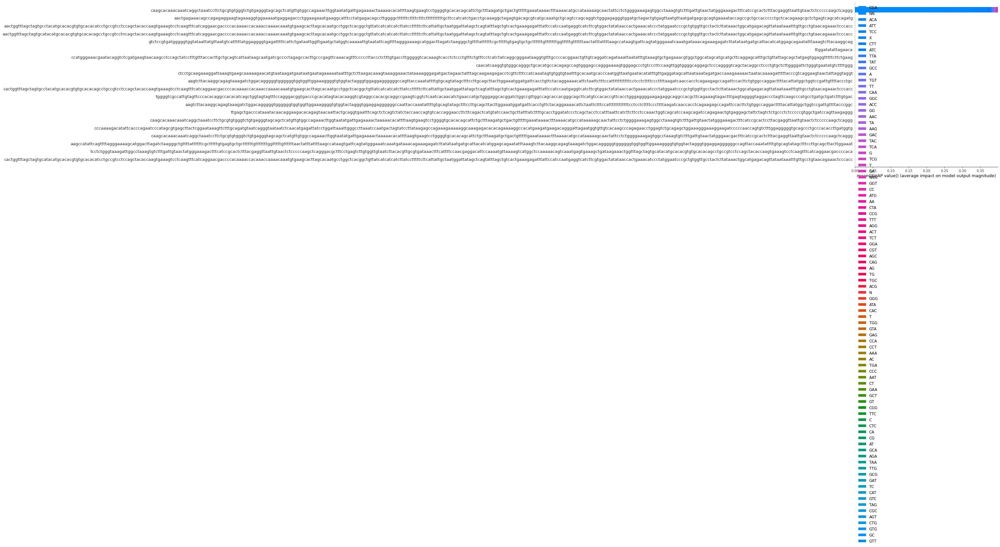

<Figure size 432x288 with 0 Axes>

In [39]:
# Define feature names and class names
feature_names = ["feature_{}".format(i) for i in range(data_train_flattened.shape[1])]
class_names = ["class_{}".format(i) for i in range(90)]  # Assuming you have 81 classes
all_words_list = [tokenizer.index_word[idx] for idx in range(1, tokenizer.num_words + 1)]

unique_class_names = OT_data['repair_outcome'].unique()

# Plot the SHAP values for the first prediction with modified class names
plt.figure(figsize=(12, 8))
shap.summary_plot(shap_values, data_test_flattened[:10], feature_names=all_words_list, class_names=unique_class_names)

# Ensure the layout is adjusted to fit all elements
plt.tight_layout()
plt.show()

In [62]:
from sklearn.model_selection import train_test_split
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
import numpy as np
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense

# Define tokenizer with reduced vocab size
vocab_size = 100
tokenizer = Tokenizer(num_words=vocab_size)
tokenizer.fit_on_texts(data)

# Define maximum sequence length
max_seq_length = 299

# Define data generator function
def data_generator(data, target, tokenizer, max_seq_length, batch_size):
    num_samples = len(data)
    indices = np.arange(num_samples)
    np.random.shuffle(indices)

    while True:
        for start in range(0, num_samples, batch_size):
            batch_indices = indices[start:start+batch_size]
            batch_data = [data[i] for i in batch_indices]
            batch_target = target[batch_indices]

            # Tokenize and pad sequences
            data_seq = tokenizer.texts_to_sequences(batch_data)
            data_padded = pad_sequences(data_seq, maxlen=max_seq_length, padding='post')

            yield data_padded, batch_target

# Convert target labels to one-hot encoded format
label_encoder = LabelEncoder()
target_encoded = label_encoder.fit_transform(target)
num_classes = len(label_encoder.classes_)
target_one_hot = to_categorical(target_encoded, num_classes=num_classes)

# Split the dataset into training, validation, and test sets
data_train, data_remaining, target_train, target_remaining = train_test_split(data, target_encoded, test_size=0.3, random_state=42)
data_val, data_test, target_val, target_test = train_test_split(data_remaining, target_remaining, test_size=0.5, random_state=42)

# Parameters
batch_size = 320

# Create data generators for training, validation, and test sets
train_generator = data_generator(data_train, target_train, tokenizer, max_seq_length, batch_size)
val_generator = data_generator(data_val, target_val, tokenizer, max_seq_length, batch_size)
test_generator = data_generator(data_test, target_test, tokenizer, max_seq_length, batch_size)

# Define model architecture
model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim))
model.add(LSTM(units=hidden_units))
model.add(Dense(num_classes, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model using generators
steps_per_epoch_train = len(data_train) // batch_size
steps_per_epoch_val = len(data_val) // batch_size
epochs = 1

# Train the model
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch_train,
                    epochs=epochs, validation_data=val_generator,
                    validation_steps=steps_per_epoch_val)

# Evaluate the model
steps_test = len(data_test) // batch_size
test_loss, test_accuracy = model.evaluate(test_generator, steps=steps_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)


5317/5317 ━━━━━━━━━━━━━━━━━━━━ 505s 95ms/step - accuracy: 0.8339 - loss: 1.0931 - val_accuracy: 0.8373 - val_loss: 0.8161
1139/1139 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - accuracy: 0.8385 - loss: 0.8125
Test Loss: 0.8149704337120056
Test Accuracy: 0.8376262187957764


In [64]:
from sklearn.model_selection import train_test_split
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
import numpy as np
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense

# Define tokenizer with reduced vocab size
vocab_size = 100
tokenizer = Tokenizer(num_words=vocab_size)
tokenizer.fit_on_texts(data)

# Define maximum sequence length
max_seq_length = 299

# Define data generator function
def data_generator(data, target, tokenizer, max_seq_length, batch_size):
    num_samples = len(data)
    indices = np.arange(num_samples)
    np.random.shuffle(indices)

    while True:
        for start in range(0, num_samples, batch_size):
            batch_indices = indices[start:start+batch_size]
            batch_data = [data[i] for i in batch_indices]
            batch_target = target[batch_indices]

            # Tokenize and pad sequences
            data_seq = tokenizer.texts_to_sequences(batch_data)
            data_padded = pad_sequences(data_seq, maxlen=max_seq_length, padding='post')

            yield data_padded, batch_target

# Convert target labels to one-hot encoded format
label_encoder = LabelEncoder()
target_encoded = label_encoder.fit_transform(target)
num_classes = len(label_encoder.classes_)
target_one_hot = to_categorical(target_encoded, num_classes=num_classes)

# Split the dataset into training, validation, and test sets
data_train, data_remaining, target_train, target_remaining = train_test_split(data, target_encoded, test_size=0.3, random_state=42)
data_val, data_test, target_val, target_test = train_test_split(data_remaining, target_remaining, test_size=0.5, random_state=42)

# Parameters
batch_size = 320

# Create data generators for training, validation, and test sets
train_generator = data_generator(data_train, target_train, tokenizer, max_seq_length, batch_size)
val_generator = data_generator(data_val, target_val, tokenizer, max_seq_length, batch_size)
test_generator = data_generator(data_test, target_test, tokenizer, max_seq_length, batch_size)

# Define model architecture
model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim))
model.add(LSTM(units=hidden_units))
model.add(Dense(num_classes, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model using generators
steps_per_epoch_train = len(data_train) // batch_size
steps_per_epoch_val = len(data_val) // batch_size
epochs = 1

# Train the model
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch_train,
                    epochs=epochs, validation_data=val_generator,
                    validation_steps=steps_per_epoch_val)

# Evaluate the model
steps_test = len(data_test) // batch_size
test_loss, test_accuracy = model.evaluate(test_generator, steps=steps_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)


5317/5317 ━━━━━━━━━━━━━━━━━━━━ 502s 94ms/step - accuracy: 0.8364 - loss: 1.0374 - val_accuracy: 0.8373 - val_loss: 0.8161
1139/1139 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - accuracy: 0.8365 - loss: 0.8190
Test Loss: 0.8149644732475281
Test Accuracy: 0.8376015424728394


NameError: name 'index_of_attention_layer' is not defined

In [65]:
model.summary()

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_18 (Embedding)        │ (None, 299, 100)       │        10,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_12 (LSTM)                  │ (None, 10)             │         4,440 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 89)             │           979 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,259 (180.70 KB)

 Trainable params: 15,419 (60.23 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 30,840 (120.47 KB)

In [67]:
# Get attention weights for test data
input_layer = model.layers[0].input
attention_weights = model.layers[1].output  # Replace index_of_attention_layer with the correct index
attention_model = Model(inputs=input_layer, outputs=attention_weights)
attention_weights = attention_model.predict(data_test)
print(attention_weights)

ValueError: Exception encountered when calling Functional.call().

[1mInvalid input shape for input Tensor("functional_16_1/Cast:0", shape=(32,), dtype=float32). Expected shape (None, 299), but input has incompatible shape (32,)[0m

Arguments received by Functional.call():
  • inputs=tf.Tensor(shape=(32,), dtype=string)
  • training=False
  • mask=None

In [63]:
# Get attention weights for test data
attention_model = Model(inputs=input_layer, outputs=attention_weights)
attention_weights = attention_model.predict(data_test)
print(attention_weights)


ValueError: Exception encountered when calling Functional.call().

[1mInvalid input shape for input Tensor("functional_11_1/Cast:0", shape=(32,), dtype=float32). Expected shape (None, 299), but input has incompatible shape (32,)[0m

Arguments received by Functional.call():
  • inputs=tf.Tensor(shape=(32,), dtype=string)
  • training=False
  • mask=None

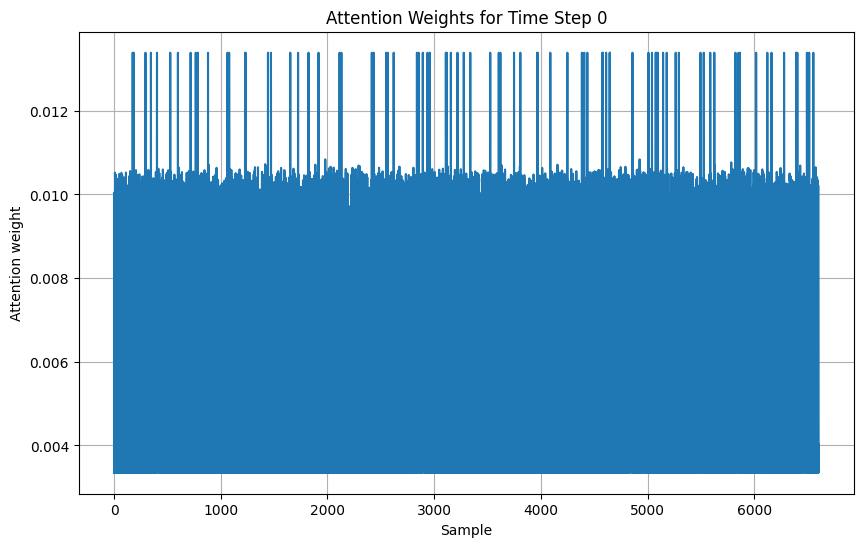

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have obtained attention weights for a specific time step
# Let's say the attention weights are stored in the variable attention_weights
# The shape of attention_weights is (6604, 299, 1)

# Choose a specific time step to visualize
time_step = 0  # Adjust this as needed

# Extract attention weights for the chosen time step
attention_weights_timestep = attention_weights[:, time_step, 0]
# Plot the attention weights
plt.figure(figsize=(10, 6))
plt.plot(attention_weights_timestep)
plt.xlabel('Sample')
plt.ylabel('Attention weight')
plt.title(f'Attention Weights for Time Step {time_step}')
plt.grid(True)
plt.show()


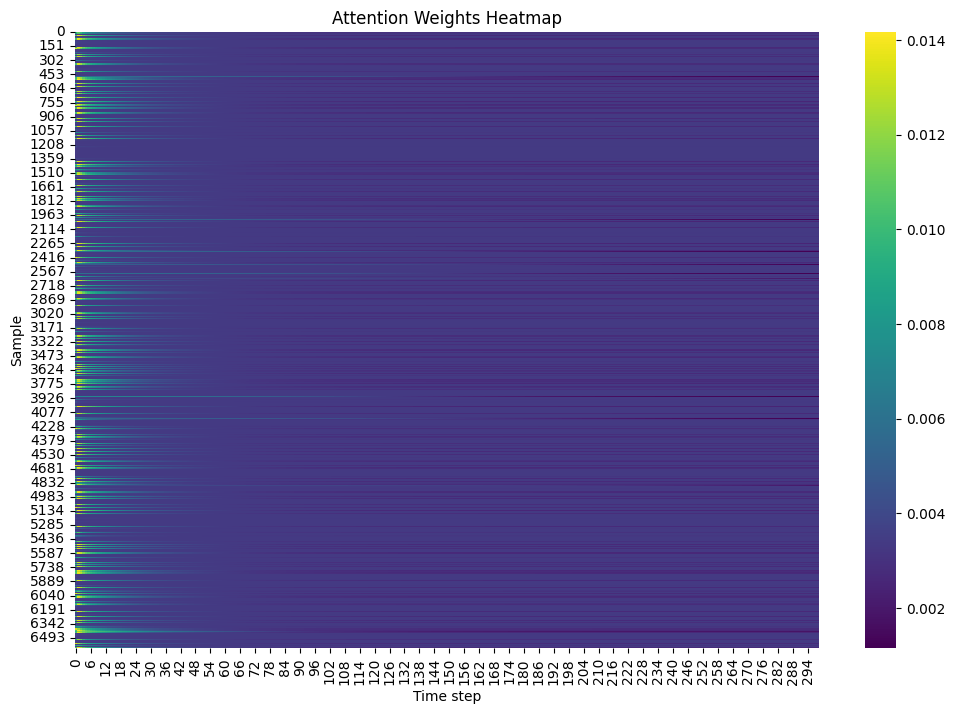

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Reshape attention weights to 2D
attention_weights_2d = attention_weights.reshape((attention_weights.shape[0], attention_weights.shape[1]))

# Plot the attention weights as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(attention_weights_2d, cmap='viridis')
plt.xlabel('Time step')
plt.ylabel('Sample')
plt.title('Attention Weights Heatmap')
plt.show()
